Spatial Filter Bank Design in the Spherical Harmonic Domain
---

Christoph Hold


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import spaudiopy as spa

plt.rcParams['savefig.dpi'] = 150
plt.rcParams['figure.figsize'] = [16 / 2, 9 / 2]
plt.rcParams['savefig.format'] = 'svg'
plt.rcParams['font.size'] = 10
plt.rcParams['lines.linewidth'] = 3
plt.rcParams['axes.grid'] = True

from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('svg')

In [2]:
N_sph = 2
N_sph_sec = N_sph
shtype = 'real'
pattern = 'maxRE'
EP = False  # Energy preservation / Amplitude preservation
PR = False  # Perfect reconstruction

Input Signal in the Spherical Harmonic Domain
---


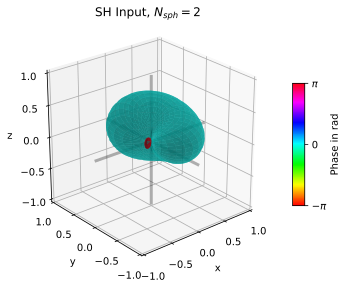

In [3]:
Omega_in1 = np.c_[0, np.pi/2]
Omega_in2 = np.c_[np.pi/2, np.pi/2]
N_sph_in = N_sph
in_nm = spa.sph.sh_matrix(N_sph_in, Omega_in1[:, 0], Omega_in1[:, 1], shtype).conj()
in_nm = spa.sph.repeat_per_order(spa.sph.cardioid_modal_weights(N_sph_in)) * in_nm  # make cardioid
in_nm += spa.sph.sh_matrix(N_sph_in, Omega_in2[:, 0], Omega_in2[:, 1], shtype).conj()  # add another

fig = plt.figure()
spa.plot.sh_coeffs(in_nm, title="SH Input, $N_{{sph}}={}$".format(N_sph), fig=fig)

Extract component in $+x$-direction:

Spatial Filter - Beamformer
---


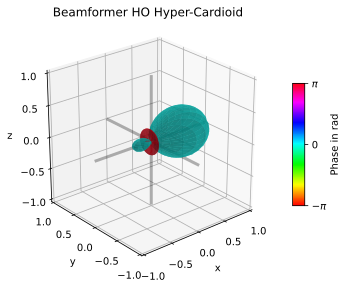

In [4]:
fig = plt.figure()
spa.plot.sh_coeffs(spa.sph.repeat_per_order(spa.sph.hypercardioid_modal_weights(N_sph)) * spa.sph.sh_matrix(N_sph, 0, np.pi/2, shtype).conj(), title="Beamformer HO Hyper-Cardioid", fig=fig)

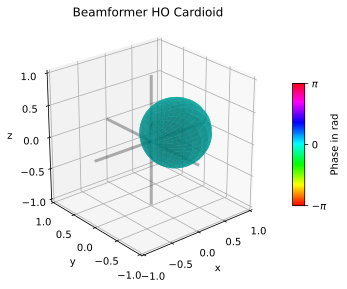

In [5]:
fig = plt.figure()
spa.plot.sh_coeffs(spa.sph.repeat_per_order(spa.sph.cardioid_modal_weights(N_sph)) * spa.sph.sh_matrix(N_sph, 0, np.pi/2, shtype).conj(), title="Beamformer HO Cardioid", fig=fig)

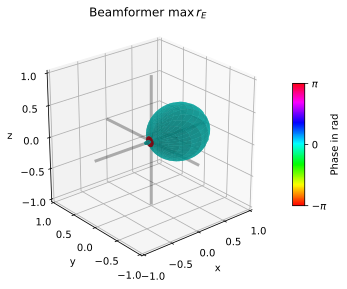

In [6]:
fig = plt.figure()
spa.plot.sh_coeffs(spa.sph.repeat_per_order(spa.sph.maxre_modal_weights(N_sph)) * spa.sph.sh_matrix(N_sph, 0, np.pi/2, shtype).conj(), title="Beamformer $\operatorname{max}r_E$", fig=fig)

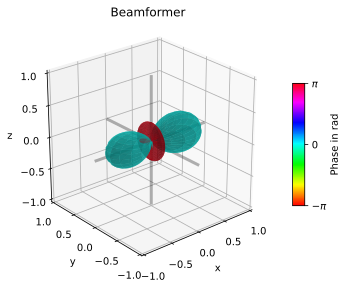

In [7]:
fig = plt.figure()
#w_nm_random = spa.sph.repeat_per_order(np.random.randn((N_sph+1)))
w_nm_random = np.array([1.04667565, 0.21148003, 0.21148003, 0.21148003, 1.88505219,
       1.88505219, 1.88505219, 1.88505219, 1.88505219])
spa.plot.sh_coeffs(w_nm_random * spa.sph.sh_matrix(N_sph_in, 0, np.pi/2, shtype).conj(), title="Beamformer", fig=fig)

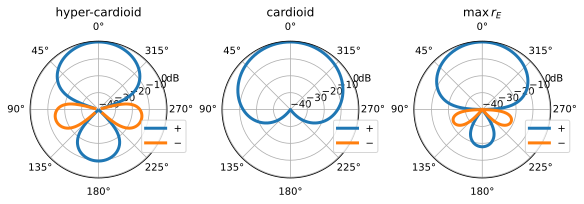

In [8]:
# cross section
cross_azi = np.linspace(0, 2 * np.pi, 720, endpoint=True)

# Bandlimited Dirac pulses

fig, axs = plt.subplots(1, 3, subplot_kw=dict(polar=True), constrained_layout=True)
spa.plot.polar(cross_azi, 
                spa.sph.bandlimited_dirac(N_sph, cross_azi, spa.sph.hypercardioid_modal_weights(N_sph)), 
                ax=axs[0], title="hyper-cardioid")
spa.plot.polar(cross_azi, 
                spa.sph.bandlimited_dirac(N_sph, cross_azi, spa.sph.cardioid_modal_weights(N_sph)), 
                ax=axs[1], title="cardioid")
spa.plot.polar(cross_azi, 
                spa.sph.bandlimited_dirac(N_sph, cross_azi, spa.sph.maxre_modal_weights(N_sph)), 
                ax=axs[2], title="$\operatorname{max}r_E$")

From a Set of Beamformers to a Spatial Filterbank
---
- Cover the full sphere with spatial filters
- Uniform sector layout, e.g. spherical t-designs

In [9]:
sec_vecs = spa.grids.load_t_design(2*N_sph_sec if (EP or PR) else N_sph_sec+1)  # N+1 or 2N
sec_azi, sec_zen, _ = spa.utils.cart2sph(*sec_vecs.T)
# number of sectors
J_sec = len(sec_vecs)

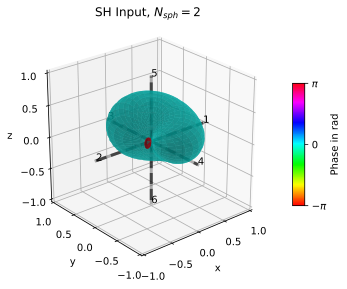

In [10]:
fig = plt.figure()
spa.plot.sh_coeffs(in_nm, title="SH Input, $N_{{sph}}={}$".format(N_sph), fig=fig)
ax = fig.gca()
for s, co in enumerate(sec_vecs):
    ax.plot(np.r_[0, sec_vecs[s, 0]],
            np.r_[0, sec_vecs[s, 1]],
            np.r_[0, sec_vecs[s, 2]],
            color='black', alpha=0.6, linestyle='dashed')
    ax.text(co[0], co[1], co[2], s+1, zorder=1, fontsize=10)

In [11]:
# Sector Analysis
if pattern.lower() == "cardioid":
    c_n = spa.sph.cardioid_modal_weights(N_sph_sec)
elif pattern.lower() == "hypercardioid":
    c_n = spa.sph.hypercardioid_modal_weights(N_sph_sec)
elif pattern.lower() == "maxre":
    c_n = spa.sph.maxre_modal_weights(N_sph_sec, True)  # works with amplitude compensation and without!
else:
    assert()

In [12]:
[A, B] = spa.sph.design_sph_filterbank(N_sph, sec_azi, sec_zen, c_n,
                                        shtype, mode='perfect' if PR else 'energy')

In [13]:
fig = plt.figure()
spa.plot.sh_coeffs_overlay([*A], fig=fig, title="Spatial Filterbank")
# loudspeaker no
ax = plt.gca()
for s, co in enumerate(np.c_[spa.utils.sph2cart(sec_azi, sec_zen, 1.1)]):
    ax.text(co[0], co[1], co[2], s+1, fontsize=10)


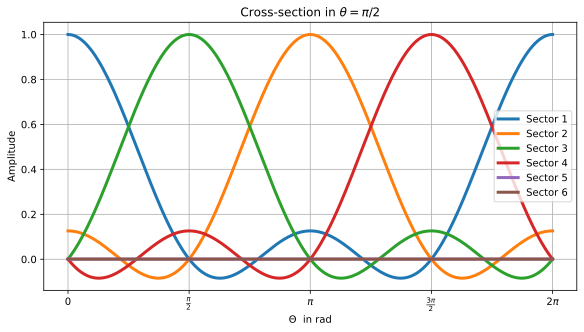

In [14]:
# 2nd order AP: 6 sectors in Cartesian axis
if J_sec == 6:
    delta_omega = np.linspace(0, 2*np.pi, 360)

    # XY-plane
    s_delta = spa.utils.angle_between([1, 0, 0], sec_vecs[:4, :])
    s_dir = np.dot(np.cross([1, 0, 0], sec_vecs[:4, :]), np.r_[0, 0, 1])
    s_delta[abs(s_dir)>0] = s_delta[abs(s_dir)>0] * np.sign(s_dir[abs(s_dir)>0])

    omega_d = np.tile(delta_omega, (4, 1)) - s_delta[:, np.newaxis]

    # Z axis
    omega_d = np.vstack((omega_d, np.pi/2 * np.ones((2, 360))))

    s = np.zeros((6, 360))
    for idx, delta_iter in enumerate(omega_d):
        s[idx, :] = spa.sph.bandlimited_dirac(2, delta_iter, 
                                              spa.sph.maxre_modal_weights(2, UNITAMP=True))

    fig = plt.figure(constrained_layout=True)
    for idx in range(6):
        plt.plot(delta_omega, s[idx, :], label="Sector " + str(idx+1))

    plt.xticks([0, np.pi/2, np.pi, 3*np.pi/2, 2*np.pi],
               ['$0$', r'$\frac{\pi}{2}$', r'$\pi$', r'$\frac{3\pi}{2}$', r'$2\pi$'])

    plt.ylabel('Amplitude')
    plt.xlabel('$\Theta$  in rad')
    plt.legend(loc='right')
    plt.grid('on')
    plt.title(r"Cross-section in $\theta = \pi/2$")

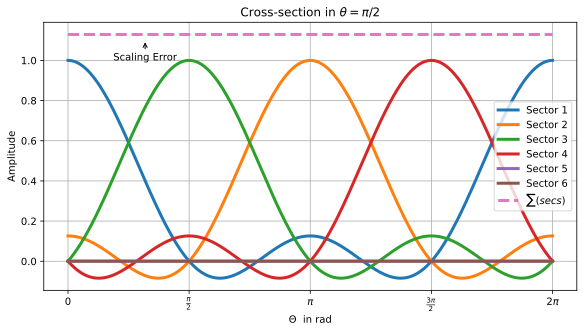

In [15]:
# 2nd order AP: 6 sectors in Cartesian axis
if J_sec == 6:
    delta_omega = np.linspace(0, 2*np.pi, 360)

    # XY-plane
    s_delta = spa.utils.angle_between([1, 0, 0], sec_vecs[:4, :])
    s_dir = np.dot(np.cross([1, 0, 0], sec_vecs[:4, :]), np.r_[0, 0, 1])
    s_delta[abs(s_dir)>0] = s_delta[abs(s_dir)>0] * np.sign(s_dir[abs(s_dir)>0])

    omega_d = np.tile(delta_omega, (4, 1)) - s_delta[:, np.newaxis]

    # Z axis
    omega_d = np.vstack((omega_d, np.pi/2 * np.ones((2, 360))))

    s = np.zeros((6, 360))
    for idx, delta_iter in enumerate(omega_d):
        s[idx, :] = spa.sph.bandlimited_dirac(2, delta_iter, 
                                              spa.sph.maxre_modal_weights(2, UNITAMP=True))

    fig = plt.figure(constrained_layout=True)
    for idx in range(6):
        plt.plot(delta_omega, s[idx, :], label="Sector " + str(idx+1))
    # Sum
    plt.plot(delta_omega, np.sum(s, 0), '--', label=r"$\sum(secs)$")

    plt.xticks([0, np.pi/2, np.pi, 3*np.pi/2, 2*np.pi],
               ['$0$', r'$\frac{\pi}{2}$', r'$\pi$', r'$\frac{3\pi}{2}$', r'$2\pi$'])

    plt.ylabel('Amplitude')
    plt.xlabel('$\Theta$  in rad')
    plt.legend(loc='right')
    plt.grid('on')
    plt.title(r"Cross-section in $\theta = \pi/2$")
    
    plt.annotate("Scaling Error", (1, 1.1), (1, 1.), ha='center', arrowprops=dict(arrowstyle = '->'))

Problem Formulation
---

The spatial sector weighting $w_\xi(\Omega)$ of sectors $\xi = 1, \dots, J$ shall 

preserve amplitude
\begin{equation}\label{eq:amp_rec}
    \sum_{\xi=1}^J \beta_{\mathrm{A}} w_\xi(\Omega) = 1 , \quad \forall \Omega \in \mathbb{S}^2
    \quad,
\end{equation}
or preserve energy
\begin{equation}\label{eq:en_rec}
    \sum_{\xi=1}^J \beta_{\mathrm{E}} w_\xi^2(\Omega) = \sum_{\xi=1}^J \left[\sqrt{\beta_{\mathrm{E}}} w_\xi(\Omega) \right]^2 = 1 , \quad \forall \Omega \in \mathbb{S}^2
    \quad,
\end{equation}

over all angles $\Omega=[\phi, \theta]$.

For the spatial weighting, axisymmetric beam patterns are described by their $N$ beamforming weights / modal weighting coefficients $c_n$ as
\begin{equation}\label{eq:SH_axisymPattern}
    w(\Theta) = \sum_{n=0}^{N} \frac{2n+1}{4\pi} c_n P_n(\cos(\Theta))
    \quad ,
\end{equation}

where the angle $\Theta = \angle (\Omega, \Omega')$ and $P_n$ the degree $n$ Legendre polynomial.

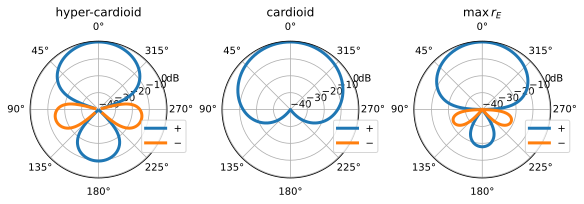

In [16]:
# cross section
cross_azi = np.linspace(0, 2 * np.pi, 720, endpoint=True)

# Bandlimited Dirac pulses

fig, axs = plt.subplots(1, 3, subplot_kw=dict(polar=True), constrained_layout=True)
spa.plot.polar(cross_azi, 
                spa.sph.bandlimited_dirac(N_sph, cross_azi, spa.sph.hypercardioid_modal_weights(N_sph)), 
                ax=axs[0], title="hyper-cardioid")
spa.plot.polar(cross_azi, 
                spa.sph.bandlimited_dirac(N_sph, cross_azi, spa.sph.cardioid_modal_weights(N_sph)), 
                ax=axs[1], title="cardioid")
spa.plot.polar(cross_azi, 
                spa.sph.bandlimited_dirac(N_sph, cross_azi, spa.sph.maxre_modal_weights(N_sph)), 
                ax=axs[2], title="$\operatorname{max}r_E$")

In SH domain, applying the spatial filter simplifies under Parseval's relation to
\begin{equation}
s_\xi = \mathbf{w}_{nm, \xi}^{\mathrm{H}} \mathbf{\sigma}_{nm}^{\mathrm{in}}
\quad,
\end{equation}
with sector signal $s_\xi$ from SH signal $\mathbf{\sigma}_{nm}^{\mathrm{in}}$.


Any axisymmetric SH sector beampattern vector $\mathbf{w}_{nm}$ in sector steering direction $\Omega_\xi$ is given as
\begin{equation} \label{eq:SH_pattern}
    \mathbf{w}_{nm} = \operatorname{diag}_N(\mathbf{c}_n) \, \mathbf{y}_n^m(\Omega_\xi)^\mathrm{H}
\quad.
\end{equation}




We derived the factors preserving

- Amplitude
\begin{equation}\label{eq:beta_a}
    \beta_{\mathrm{A}} = \bigg[\sum_{\xi=1}^J w_\xi(\Omega)\bigg]^{-1} = \frac{4\pi}{c_0 \, J}
    = \frac{\sqrt{4\pi}}{w_{00}\,J}
    \;.
\end{equation}
- Energy
\begin{equation}\label{eq:beta_e}
    \beta_{\mathrm{E}} = \bigg[\sum_{\xi=1}^J w_\xi^2(\Omega)\bigg]^{-1} = \frac{4\pi}{\mathbf{w}_{nm}^\mathrm{H} \mathbf{w}_{nm}^{} J}
    \;.
\end{equation}

Application
---

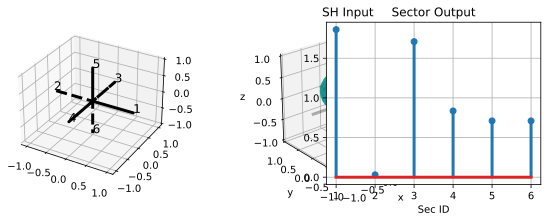

In [17]:
fig, axs = plt.subplots(1, 2, figsize=(10, 3), subplot_kw={'projection':'3d'})
plt.sca(axs[0])
spa.plot.sh_coeffs(in_nm, title="SH Input", fig=fig)
axs[0].plot(np.insert(sec_vecs[:, 0], np.arange(J_sec), np.zeros(J_sec)),
        np.insert(sec_vecs[:, 1], np.arange(J_sec), np.zeros(J_sec)), 
        np.insert(sec_vecs[:, 2], np.arange(J_sec), np.zeros(J_sec)),
        color='black', linestyle='dashed')
for s, co in enumerate(sec_vecs):
    axs[0].text(co[0], co[1], co[2], s+1, zorder=1, fontsize=12)

# Apply sectors
delta_numSH = (N_sph_in+1)**2 - (N_sph_sec+1)**2
pw_secs_out = np.c_[A, np.zeros([J_sec, delta_numSH])].conj() @ in_nm.T
pw_secs_out = np.real_if_close(pw_secs_out)

#axs[1].remove()
#axs[1] = fig.add_subplot(1, 3, 2)
#axs[1].axis('off')
#axs[1].text(0, 0, s="text", fontsize=15)

axs[1].remove()
axs[1] = fig.add_subplot(1, 2, 2)
axs[1].stem(np.arange(J_sec)+1, pw_secs_out)
axs[1].set_xlabel("Sec ID")
axs[1].set_title("Sector Output")
plt.subplots_adjust(wspace=0.6)

Application - Impulse Response Spatial Analysis
---

In [18]:
fs = 48000
t = np.arange(0, 3, 1/fs)
t60 = 2. # s

# SH domain
sigs_in_nm = 1 * np.exp(-t/(t60/6.9))[:,None] * \
    np.random.normal(0, 1, size=(len(t),(N_sph+1)**2))
sigs_in_nm += 2 * np.exp(-t/(t60/6.9))[:,None] * \
                np.random.normal(0, 1, size=(len(t),1)) * \
                spa.sph.sh_matrix(N_sph, 0, np.pi/2, shtype).conj()

In [19]:
def plot_sph_rms(F_nm, title=None, fig=None):
    assert(F_nm.ndim == 2)
    grid_azi, grid_zen, grid_r = spa.utils.cart2sph(*spa.grids.load_n_design(40).T)
    # Looking with hyper-cardioids
    s_grid = F_nm @ ((4*np.pi)/((N_sph+1)**2) * spa.sph.sh_matrix(N_sph, grid_azi, grid_zen, shtype)).T
    s_rms = spa.utils.rms(s_grid, axis=0)  # why is this sqrt(4pi/nSH)?!
    spa.plot.spherical_function(s_rms+1e-15, grid_azi, grid_zen,
                                 title="RMS = " + str(np.round(s_rms.mean(), 3)) if title is None else title,
                                 fig=fig)
    return s_rms.mean()

RMS:  [0.251 0.219 0.218 0.308 0.217 0.219 0.263 0.221 0.327]


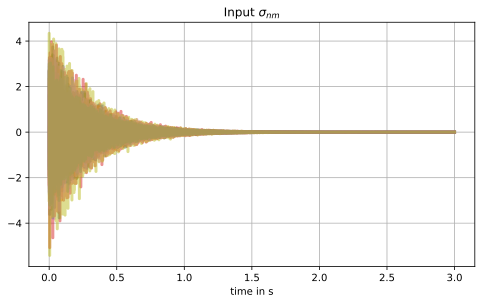

In [20]:
plt.plot(t, sigs_in_nm, alpha=0.5)
plt.xlabel("time in s")
plt.title("Input $\sigma_{nm}$")
print("RMS: ", np.round(spa.utils.rms(sigs_in_nm, axis=0), 3))

Sector Analysis

RMS:  [0.521 0.283 0.279 0.276 0.279 0.275]


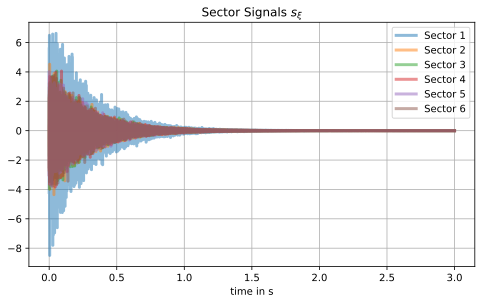

In [21]:
sigs_sec = (A @ sigs_in_nm.T).T

plt.plot(t, sigs_sec, alpha=0.5)
plt.xlabel("time in s")
plt.title(r"Sector Signals $s_{\xi}$")
plt.legend(["Sector " + str(idx+1) for idx in range(J_sec)])

print("RMS: ", np.round(spa.utils.rms(sigs_sec, axis=0), 3))

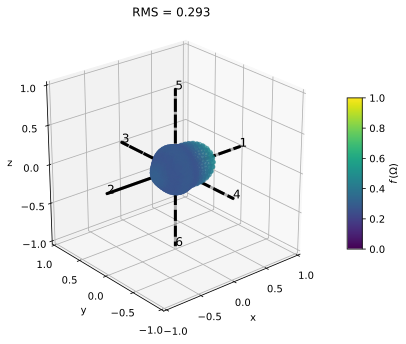

In [22]:
rms_in = plot_sph_rms(sigs_in_nm)
ax = plt.gca()
ax.plot(np.insert(sec_vecs[:, 0], np.arange(J_sec), np.zeros(J_sec)),
        np.insert(sec_vecs[:, 1], np.arange(J_sec), np.zeros(J_sec)), 
        np.insert(sec_vecs[:, 2], np.arange(J_sec), np.zeros(J_sec)),
        color='black', linestyle='dashed')
for s, co in enumerate(sec_vecs):
    ax.text(co[0], co[1], co[2], s+1, zorder=1, fontsize=12)

Filterbank
---

Analysis
\begin{equation}
    \bf{s}_\xi = \bf{A} \, \bf{\sigma}_{nm}^{\mathrm{in}}
\quad.
\end{equation}


Synthesis
\begin{equation}\label{eq:SFB_syn}
    \bf{\sigma}_{nm}^{\mathrm{out}} = \bf{B}^\mathrm{H} \, \bf{s}_\xi
\quad.
\end{equation}


Reconstruction - Criteria
---

- Perfect Reconstruction
\begin{equation}\label{eq:Criterion_PerfectReconstruction}
    \sigma_{nm}^{\mathrm{out}}(t) \overset{!}{=} \sigma_{nm}^{\mathrm{in}}(t)  , \quad \forall t
\quad,
\end{equation}

- Energy Reconstruction
\begin{equation}\label{eq:Criterion_EnergyReconstruction}
    \left< \sigma_{nm}^{\mathrm{out}}(t), \sigma_{nm}^{\mathrm{out}}(t) \right> \overset{!}{=} \left< \sigma_{nm}^{\mathrm{in}}(t), \sigma_{nm}^{\mathrm{in}}(t) \right>
\quad.
\end{equation}

With

\begin{equation}
    \mathbf{w}_{nm} = \operatorname{diag}_N(\mathbf{c}_n) \, \mathbf{y}_n^m(\Omega_\xi)^\mathrm{H}
\quad,
\end{equation}
we can expand the analysis and synthesis matrix as

\begin{equation}\label{eq:def_A}
    \mathbf{A}_{\xi, nm} = \left[\operatorname{diag}_N(\mathbf{c}_n^{\mathrm{\mathrm{an}}}) \mathbf{Y}^\mathrm{H} \right]^\mathrm{H} = \mathbf{Y} \operatorname{diag}_N(\mathbf{c}_n^{\mathrm{an}})
\quad,
\end{equation}
and
\begin{equation}\label{eq:def_B}
    \mathbf{B}_{\xi, nm} = \mathbf{Y} \operatorname{diag}_N(\mathbf{c}_n^{\mathrm{syn}})
\quad.
\end{equation}


Reconstruction
---
- Perfect Reconstruction
\begin{equation}\label{eq:synthesisAmp}
    \mathbf{\sigma}_{nm}^{\mathrm{out}}(t) = \beta_A \mathbf{B}^\mathrm{H} \mathbf{s}_\xi(t)
\quad,
\end{equation}

- Energy Reconstruction
\begin{equation}\label{eq:synthesisEn}
    \mathbf{\sigma}_{nm}^{\mathrm{out}}(t) = \sqrt{\beta_E} \mathbf{B}^\mathrm{H} \tilde{\mathbf{s}}_\xi(t)
\quad,
\end{equation}

where 
\begin{equation}
\mathbf{B}_{\xi, nm} = \mathbf{Y} \operatorname{diag}_N(\mathbf{c}_n^{\mathrm{syn}}) 
\quad, \text{with} \quad c_n^{\mathrm{syn}} = \frac{1}{c_n^{\mathrm{an}}/c_0^{\mathrm{an}}}
\end{equation}



Application
---

Create diffuse signal with shape of input signal.

- Analyze Ambisonic signal ($N_{sph} = 3$)
- Replace sector signals
- Reconstruct to Ambisonic signal, preserving energy

In [23]:
N_sph = 3
N_sph_sec = N_sph
PR = False  # Now we want energy reconstruction
EP = True
sec_vecs = spa.grids.load_t_design(2*N_sph_sec if (EP or PR) else N_sph_sec+1)  # N+1 or 2N
sec_azi, sec_zen, _ = spa.utils.cart2sph(*sec_vecs.T)
# number of sectors
J_sec = len(sec_vecs)

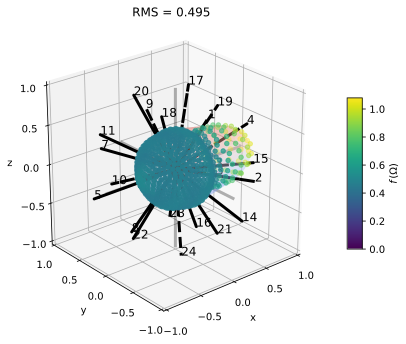

In [24]:
sigs_in_nm = 0.5 * \
    np.random.normal(0, 1, size=(len(t),(N_sph+1)**2))
sigs_in_nm += 1 *  \
                np.random.normal(0, 1, size=(len(t),1)) * \
                spa.sph.sh_matrix(N_sph, 0, np.pi/2, shtype).conj()
rms_in = plot_sph_rms(sigs_in_nm)
ax = plt.gca()
ax.plot(np.insert(sec_vecs[:, 0], np.arange(J_sec), np.zeros(J_sec)),
        np.insert(sec_vecs[:, 1], np.arange(J_sec), np.zeros(J_sec)), 
        np.insert(sec_vecs[:, 2], np.arange(J_sec), np.zeros(J_sec)),
        color='black', linestyle='dashed')
for s, co in enumerate(sec_vecs):
    ax.text(co[0], co[1], co[2], s+1, zorder=1, fontsize=12)

In [25]:
c_n = spa.sph.maxre_modal_weights(N_sph, True)
[A, B] = spa.sph.design_sph_filterbank(N_sph, sec_azi, sec_zen, c_n,
                                        shtype, mode='perfect' if PR else 'energy')

Sector Analysis

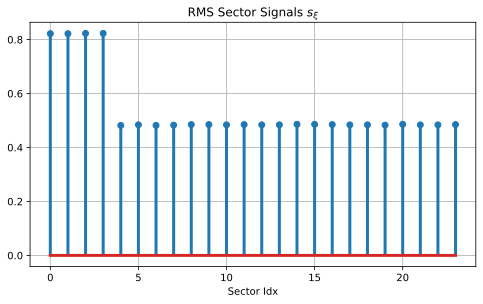

In [26]:
sigs_sec = (A @ sigs_in_nm.T).T
sec_rms = np.round(spa.utils.rms(sigs_sec, axis=0), 3)

#plt.plot(t[:fs], sigs_sec[:fs, :], alpha=0.5)
#plt.xlabel("time in s")
#plt.title(r"Sector Signals $s_{\xi}$")
#plt.legend(["Sector " + str(idx+1) for idx in range(J_sec)], loc='right')
#print("RMS: ", sec_rms)

plt.stem(sec_rms)
plt.title(r"RMS Sector Signals $s_{\xi}$")
plt.xlabel("Sector Idx");

- Replace sector signals by new independent white noise sequences
- Apply spatial bandwith limitation

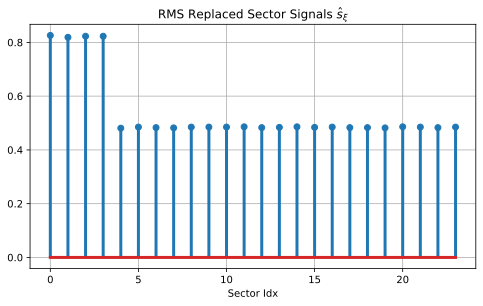

In [27]:
sec_gains = sec_rms * np.ones(J_sec)
sigs_sec_r = sec_gains *  \
             np.random.normal(0, 1, size=(len(t),J_sec))

#plt.plot(t[:fs], sigs_sec_r[:fs, :], alpha=0.5)
#plt.xlabel("time in s")
#plt.title(r"Replaced Sector Signals $\hat s_{\xi}$")
#plt.legend(["Sector " + str(idx+1) for idx in range(J_sec)], loc='right')
#print("RMS: ", np.round(spa.utils.rms(sigs_sec_r, axis=0), 3))

plt.stem(np.round(spa.utils.rms(sigs_sec_r, axis=0), 3))
plt.title(r"RMS Replaced Sector Signals $\hat s_{\xi}$")
plt.xlabel("Sector Idx");

/var/folders/c3/kmslgy_s5633b97ysvr59lnh034hk7/T/ipykernel_30794/1308496816.py:6: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


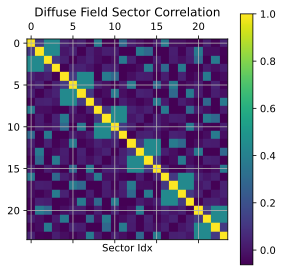

In [28]:
Ys = spa.sph.sh_matrix(N_sph, sec_azi, sec_zen, 'real')
R = Ys @ np.diag(spa.sph.repeat_per_order(c_n))@ Ys.T

plt.matshow(R)
plt.xlabel("Sector Idx")
plt.colorbar()
plt.title("Diffuse Field Sector Correlation");

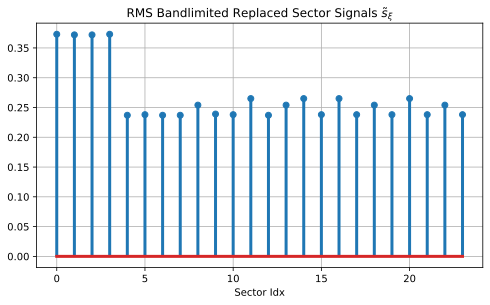

In [29]:
R = R / np.sum(R, axis=0)
sigs_sec_r = sigs_sec_r @ R

plt.stem(np.round(spa.utils.rms(sigs_sec_r, axis=0), 3))
plt.title(r"RMS Bandlimited Replaced Sector Signals $\tilde s_{\xi}$")
plt.xlabel("Sector Idx");

Resynthesis to SH domain
---
Either 
- perfect reconstruction property (e.g. when only applying linear processing)
or
- energy preserving reconstruction (e.g. from decorrelated sector signals)

In [30]:
sigs_resynth_nm = (B @ sigs_sec_r.T).T

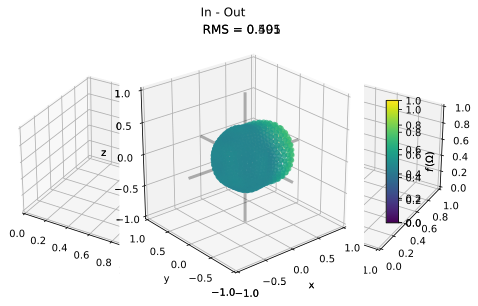

In [31]:
fig, axs = plt.subplots(1, 2, subplot_kw=dict(projection='3d'))
plt.sca(axs[0])
rms_in = plot_sph_rms(sigs_in_nm, fig=fig)
plt.sca(axs[1])
rms_out = plot_sph_rms(sigs_resynth_nm, fig=fig)
plt.suptitle("In - Out");
#print(np.diag(sigs_in_nm.T @ sigs_in_nm).sum())
#print(np.diag(sigs_resynth_nm.T @ sigs_resynth_nm).sum())

References
---
Hold, C., Politis, A., Mc Cormack, L., & Pulkki, V. (2021). Spatial Filter Bank Design in the Spherical Harmonic Domain. Proceedings of European Signal Processing Conference, August, 106–110.

Hold, C., Schlecht, S. J., Politis, A., & Pulkki, V. (2021). SPATIAL FILTER BANK IN THE SPHERICAL HARMONIC DOMAIN : RECONSTRUCTION AND APPLICATION. IEEE Workshop on Applications of Signal Processing to Audio and Acoustics (WASPAA), 1(1).

In [32]:
%%capture
# Create Static
#!jupyter-nbconvert --to html SpatialFilterbank.ipynb --TagRemovePreprocessor.remove_input_tags hide_input
# Create Slides
!jupyter-nbconvert --to slides SphericalFilterbank.ipynb --SlidesExporter.reveal_scroll=True --TagRemovePreprocessor.remove_input_tags hide_input

# PDF
#!jupyter-nbconvert --to pdf SpatialFilterbank.ipynb --TagRemovePreprocessor.remove_input_tags hide_input